# Traditional Reconstruction Methods using SfM and MVS

# SfM

This notebook walks through every step of an **incremental Structure from Motion (SfM)** pipeline from scratch, using only OpenCV + NumPy + SciPy.

### Pipeline overview
| # | Step | What happens |
|---|------|-------------|
| 0 | Setup | Load images, set up paths |
| 1 | Feature Detection | Detect SIFT keypoints + descriptors in each image |
| 2 | Feature Matching | Match descriptors across image pairs (Lowe ratio test) |
| 3 | Geometric Verification | Find Fundamental matrix (RANSAC), filter outliers |
| 4 | Camera Intrinsics | Estimate / load camera matrix K |
| 5 | Essential Matrix | Compute E = Kᵀ F K, decompose to R, t |
| 6 | Triangulation | Triangulate the initial 3-D point cloud |
| 7 | Incremental Reconstruction | Add remaining cameras via PnP + new triangulation |
| 8 | Bundle Adjustment | Jointly refine all camera poses and 3-D points (LM) |
| 9 | Visualisation | 3-D point cloud, camera trajectory, reprojection check |

## Step 0 – Setup & imports

In [21]:
import sys, os
sys.path.insert(0, os.path.abspath(".."))   # add repo root to path

import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams["figure.dpi"] = 110

# SfM utilities (utils/sfm.py)
from utils.sfm import (
    load_image, detect_and_describe,
    match_features, geometric_verification,
    estimate_intrinsics, compute_essential, recover_pose,
    build_projection_matrix, triangulate_points, filter_triangulated,
    SfMReconstruction, run_sfm,
    bundle_adjustment, compute_reprojection_error,
    # visualisation helpers
    show_keypoints, show_matches, plot_epipolar_lines,
    plot_3d_reconstruction, plot_reprojection, plot_sfm_summary,
)
from utils.imageSelector import select_equally_distributed_images

print("Imports OK")

Imports OK


### Choose images

We use the miniature images (low-resolution versions) to keep things fast.  
Adjust `N_IMAGES` to control how many views to reconstruct.

Selected 20 images:
  IMG_20251230_154141.jpg
  IMG_20251230_154207.jpg
  IMG_20251230_154210.jpg
  IMG_20251230_154214.jpg
  IMG_20251230_154217.jpg
  IMG_20251230_154220.jpg
  IMG_20251230_154223.jpg
  IMG_20251230_154226.jpg
  IMG_20251230_154229.jpg
  IMG_20251230_154231.jpg
  IMG_20251230_154235.jpg
  IMG_20251230_154238.jpg
  IMG_20251230_154241.jpg
  IMG_20251230_154244.jpg
  IMG_20251230_154247.jpg
  IMG_20251230_154250.jpg
  IMG_20251230_154255.jpg
  IMG_20251230_154301.jpg
  IMG_20251230_154304.jpg
  IMG_20251230_154307.jpg

Image size: 3472×4624 px


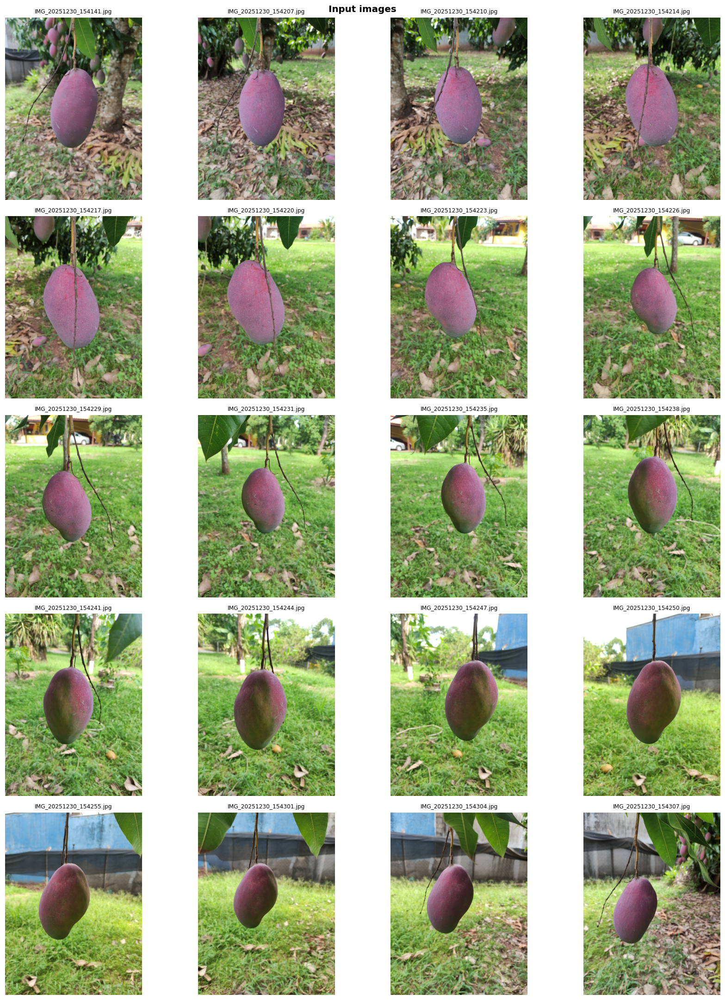

In [22]:
IMAGE_DIR  = "../data/images_crops_rotated"
N_IMAGES   = 20         # number of images to use (max = all available)
FEATURE    = "SIFT"    # 'SIFT' | 'ORB' | 'AKAZE'

image_paths = select_equally_distributed_images(IMAGE_DIR, N_IMAGES)
print(f"Selected {len(image_paths)} images:")
for p in image_paths:
    print(" ", os.path.basename(p))

# Load all images once
images = [load_image(p) for p in image_paths]
print(f"\nImage size: {images[0].shape[1]}×{images[0].shape[0]} px")

# Preview grid
ncols = min(4, len(images))
nrows = (len(images) + ncols - 1) // ncols
fig, axes = plt.subplots(nrows, ncols, figsize=(16, 4 * nrows))
axes = np.array(axes).ravel()
for i, img in enumerate(images):
    axes[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes[i].set_title(os.path.basename(image_paths[i]), fontsize=8)
    axes[i].axis("off")
for j in range(i + 1, len(axes)):
    axes[j].axis("off")
plt.suptitle("Input images", fontsize=13, fontweight="bold")
plt.tight_layout()
plt.show()

## Step 1 – Feature Detection & Description

We detect **SIFT** (Scale-Invariant Feature Transform) keypoints and compute 128-D descriptors.  
Each keypoint encodes location, scale, and orientation, making them invariant to rotation, scale, and partially to illumination changes.

  Image 0:  4361 keypoints  [IMG_20251230_154141.jpg]
  Image 1: 10000 keypoints  [IMG_20251230_154207.jpg]
  Image 2: 10000 keypoints  [IMG_20251230_154210.jpg]
  Image 3: 10000 keypoints  [IMG_20251230_154214.jpg]
  Image 4:  6457 keypoints  [IMG_20251230_154217.jpg]
  Image 5:  9033 keypoints  [IMG_20251230_154220.jpg]
  Image 6: 10000 keypoints  [IMG_20251230_154223.jpg]
  Image 7:  6951 keypoints  [IMG_20251230_154226.jpg]
  Image 8:  9475 keypoints  [IMG_20251230_154229.jpg]
  Image 9:  6607 keypoints  [IMG_20251230_154231.jpg]
  Image 10:  7620 keypoints  [IMG_20251230_154235.jpg]
  Image 11:  6446 keypoints  [IMG_20251230_154238.jpg]
  Image 12:  6036 keypoints  [IMG_20251230_154241.jpg]
  Image 13:  5367 keypoints  [IMG_20251230_154244.jpg]
  Image 14:  5397 keypoints  [IMG_20251230_154247.jpg]
  Image 15:  4532 keypoints  [IMG_20251230_154250.jpg]
  Image 16:  4837 keypoints  [IMG_20251230_154255.jpg]
  Image 17:  6915 keypoints  [IMG_20251230_154301.jpg]
  Image 18:  5007 ke

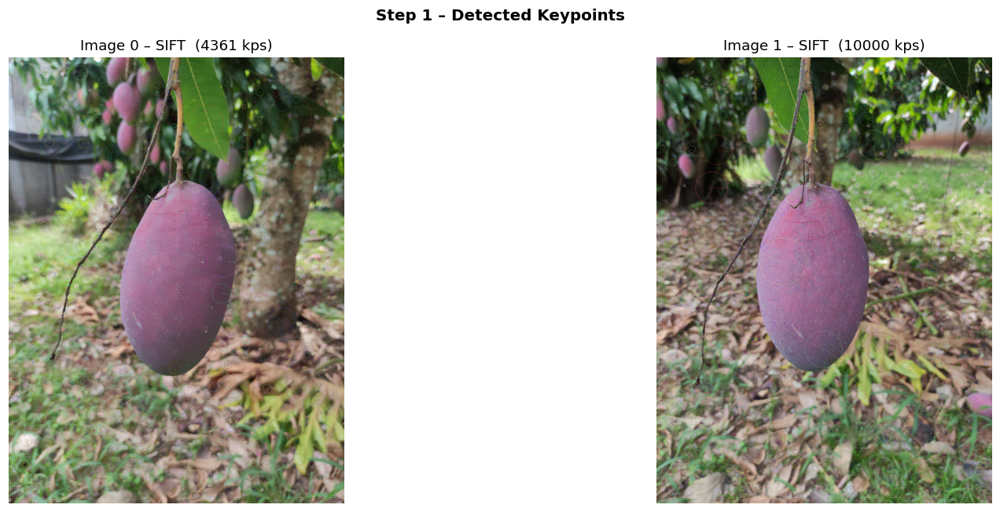

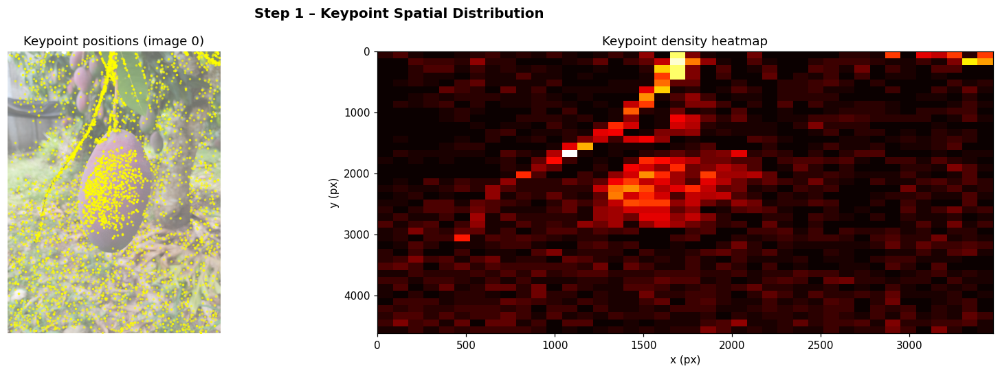

In [23]:
# Detect & describe features in every image
keypoints_all, descriptors_all = [], []
for i, img in enumerate(images):
    kp, des = detect_and_describe(img, method=FEATURE, max_features=10000)
    keypoints_all.append(kp)
    descriptors_all.append(des)
    print(f"  Image {i}: {len(kp):>5} keypoints  [{os.path.basename(image_paths[i])}]")

# --- Visualise keypoints for two images side by side ---
fig, axes = plt.subplots(1, 2, figsize=(18, 6))
show_keypoints(images[0], keypoints_all[0], title=f"Image 0 – {FEATURE}", ax=axes[0])
show_keypoints(images[1], keypoints_all[1], title=f"Image 1 – {FEATURE}", ax=axes[1])
plt.suptitle("Step 1 – Detected Keypoints", fontsize=13, fontweight="bold")
plt.tight_layout()
plt.show()

# --- Keypoint distribution heatmap for image 0 ---
h, w = images[0].shape[:2]
pts_arr = np.array([kp.pt for kp in keypoints_all[0]])
fig, axes = plt.subplots(1, 2, figsize=(16, 5))
axes[0].imshow(cv2.cvtColor(images[0], cv2.COLOR_BGR2RGB), alpha=0.6)
axes[0].scatter(pts_arr[:, 0], pts_arr[:, 1], s=2, c="yellow", alpha=0.5)
axes[0].set_title("Keypoint positions (image 0)")
axes[0].axis("off")

axes[1].hist2d(pts_arr[:, 0], pts_arr[:, 1], bins=40,
               range=[[0, w], [0, h]], cmap="hot")
axes[1].invert_yaxis()
axes[1].set_title("Keypoint density heatmap")
axes[1].set_xlabel("x (px)")
axes[1].set_ylabel("y (px)")
plt.suptitle("Step 1 – Keypoint Spatial Distribution", fontsize=13, fontweight="bold")
plt.tight_layout()
plt.show()

## Step 2 – Feature Matching

We match descriptors between every consecutive pair using a **KNN matcher** (k=2) and apply **Lowe's ratio test** to filter ambiguous matches.

> A match (m, n) is kept when `m.distance < ratio × n.distance`.

  Pair (0,1):   254 matches after ratio test
  Pair (1,2):   551 matches after ratio test
  Pair (2,3):   449 matches after ratio test
  Pair (3,4):   604 matches after ratio test
  Pair (4,5):   682 matches after ratio test
  Pair (5,6):   615 matches after ratio test
  Pair (6,7):   578 matches after ratio test
  Pair (7,8):  1107 matches after ratio test
  Pair (8,9):   895 matches after ratio test
  Pair (9,10):  1061 matches after ratio test
  Pair (10,11):   659 matches after ratio test
  Pair (11,12):   579 matches after ratio test
  Pair (12,13):   493 matches after ratio test
  Pair (13,14):   568 matches after ratio test
  Pair (14,15):   184 matches after ratio test
  Pair (15,16):   254 matches after ratio test
  Pair (16,17):   548 matches after ratio test
  Pair (17,18):   284 matches after ratio test
  Pair (18,19):   331 matches after ratio test


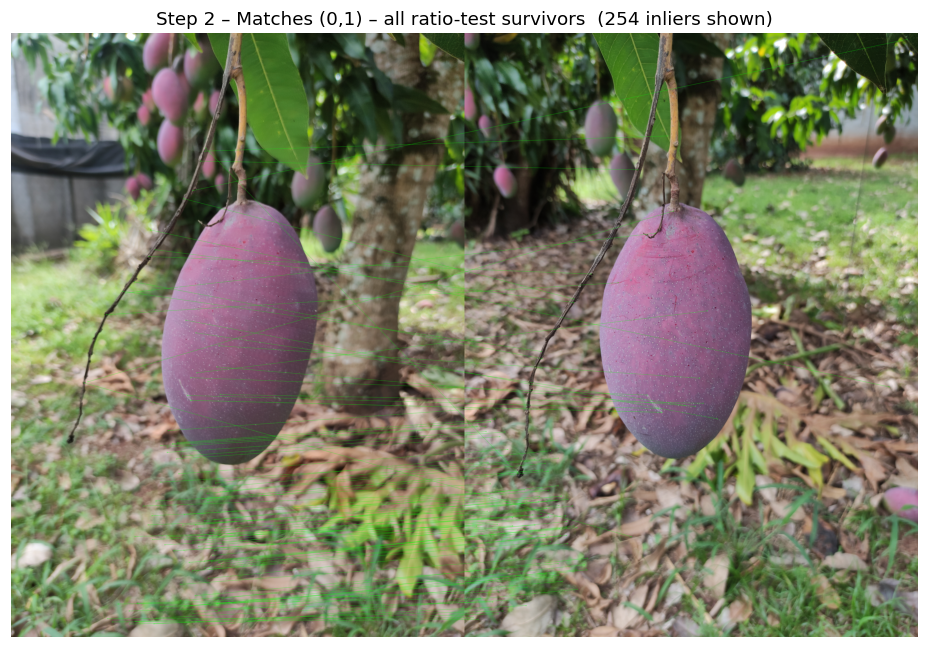

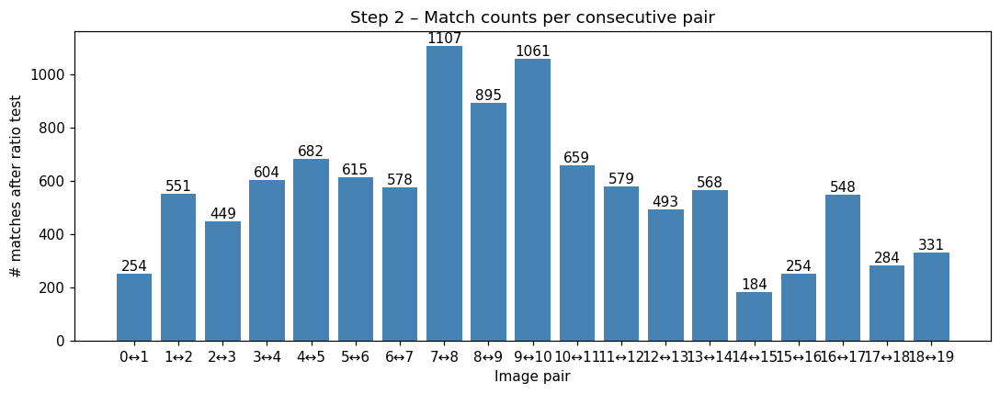

In [24]:
RATIO = 0.75  # Lowe ratio threshold

all_matches = {}   # (i,j) -> (good_matches, pts_i, pts_j)
for i in range(len(images) - 1):
    j = i + 1
    good, pts_i, pts_j = match_features(
        keypoints_all[i], descriptors_all[i],
        keypoints_all[j], descriptors_all[j],
        method="FLANN" if FEATURE == "SIFT" else "BF",
        ratio=RATIO,
    )
    all_matches[(i, j)] = (good, pts_i, pts_j)
    print(f"  Pair ({i},{j}): {len(good):>5} matches after ratio test")

# --- Visualise the first pair ---
pair = (0, 1)
good_m, p0, p1 = all_matches[pair]
fig, ax = plt.subplots(figsize=(18, 6))
show_matches(images[0], keypoints_all[0],
             images[1], keypoints_all[1],
             good_m, title="Step 2 – Matches (0,1) – all ratio-test survivors", ax=ax)
plt.tight_layout()
plt.show()

# --- Match count across pairs ---
fig, ax = plt.subplots(figsize=(10, 4))
labels = [f"{a}↔{b}" for a, b in all_matches]
counts = [len(v[0]) for v in all_matches.values()]
bars = ax.bar(labels, counts, color="steelblue")
ax.bar_label(bars)
ax.set_xlabel("Image pair")
ax.set_ylabel("# matches after ratio test")
ax.set_title("Step 2 – Match counts per consecutive pair")
plt.tight_layout()
plt.show()

## Step 3 – Geometric Verification (Fundamental Matrix + RANSAC)

The ratio-test matches still contain outliers (wrong correspondences).  
We use **RANSAC** to robustly estimate the **Fundamental matrix F**, which encodes the epipolar geometry between two views.  
Any match that doesn't satisfy $\mathbf{x}'^T F\, \mathbf{x} \approx 0$ is rejected as an outlier.

$$F \in \mathbb{R}^{3\times3}, \quad \text{rank}(F)=2$$

  Pair (0,1):   254 →   137 inliers  (53.9%)
  Pair (1,2):   551 →   366 inliers  (66.4%)
  Pair (2,3):   449 →   267 inliers  (59.5%)
  Pair (3,4):   604 →   347 inliers  (57.5%)
  Pair (4,5):   682 →   362 inliers  (53.1%)
  Pair (5,6):   615 →   358 inliers  (58.2%)
  Pair (6,7):   578 →   287 inliers  (49.7%)
  Pair (7,8):  1107 →   585 inliers  (52.8%)
  Pair (8,9):   895 →   614 inliers  (68.6%)
  Pair (9,10):  1061 →   656 inliers  (61.8%)
  Pair (10,11):   659 →   334 inliers  (50.7%)
  Pair (11,12):   579 →   339 inliers  (58.5%)
  Pair (12,13):   493 →   270 inliers  (54.8%)
  Pair (13,14):   568 →   313 inliers  (55.1%)
  Pair (14,15):   184 →    70 inliers  (38.0%)
  Pair (15,16):   254 →    96 inliers  (37.8%)
  Pair (16,17):   548 →   363 inliers  (66.2%)
  Pair (17,18):   284 →   120 inliers  (42.3%)
  Pair (18,19):   331 →   178 inliers  (53.8%)


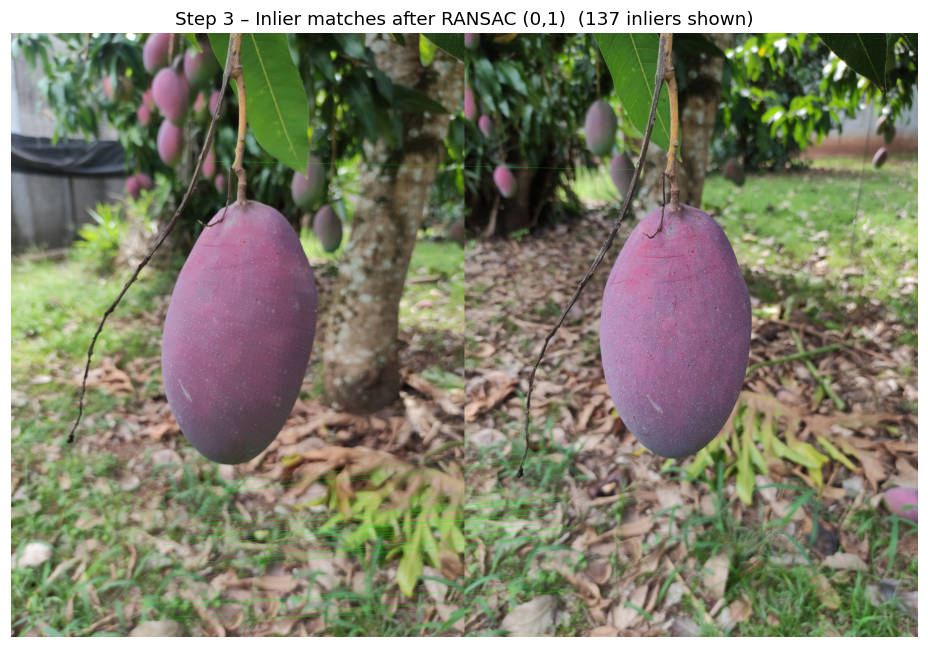

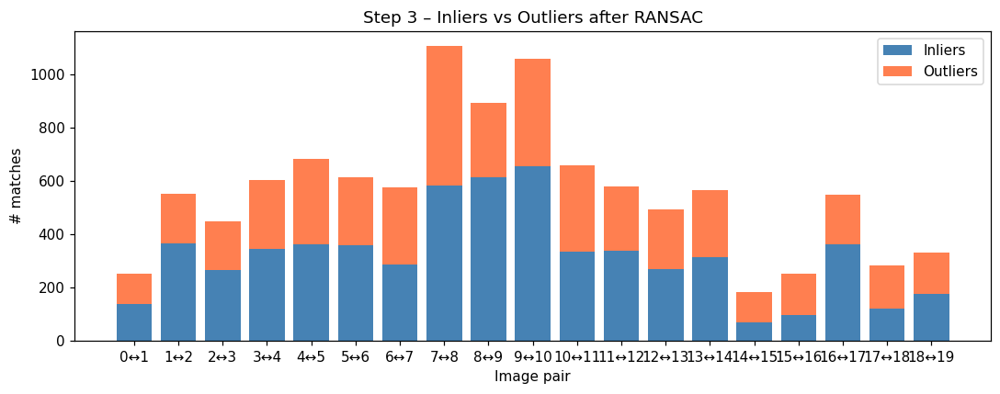

In [25]:
verified_matches = {}  # (i,j) -> (F, inlier_mask, pts_i_inlier, pts_j_inlier)

for (i, j), (good_m, pts_i, pts_j) in all_matches.items():
    if len(pts_i) < 8:
        print(f"  Pair ({i},{j}): too few matches, skipping")
        continue
    F, mask = geometric_verification(pts_i, pts_j, mode="fundamental", reproj_threshold=3.0)
    inliers = int(mask.sum())
    verified_matches[(i, j)] = (F, mask, pts_i[mask], pts_j[mask])
    print(f"  Pair ({i},{j}): {len(pts_i):>5} → {inliers:>5} inliers  "
          f"({100*inliers/len(pts_i):.1f}%)")

# --- Visualise inlier matches for the first pair ---
pair = (0, 1)
good_m_p, pts_p0, pts_p1 = all_matches[pair]
F01, mask01, *_ = verified_matches[pair]

fig, ax = plt.subplots(figsize=(18, 6))
show_matches(images[0], keypoints_all[0],
             images[1], keypoints_all[1],
             good_m_p, mask=mask01,
             title="Step 3 – Inlier matches after RANSAC (0,1)", ax=ax)
plt.tight_layout()
plt.show()

# --- Inlier vs outlier ratio bar chart ---
fig, ax = plt.subplots(figsize=(10, 4))
pair_labels = [f"{a}↔{b}" for a, b in verified_matches]
outlier_counts = [len(all_matches[k][1]) - verified_matches[k][1].sum()
                  for k in verified_matches]
inlier_counts  = [verified_matches[k][1].sum() for k in verified_matches]
ax.bar(pair_labels, inlier_counts,  label="Inliers",  color="steelblue")
ax.bar(pair_labels, outlier_counts, bottom=inlier_counts, label="Outliers", color="coral")
ax.set_xlabel("Image pair")
ax.set_ylabel("# matches")
ax.set_title("Step 3 – Inliers vs Outliers after RANSAC")
ax.legend()
plt.tight_layout()
plt.show()

### Epipolar lines

Given F, every left-image point $\mathbf{x}$ defines a line $\ell' = F\mathbf{x}$ in the right image on which the corresponding point must lie (and vice-versa).  
These are called **epipolar lines** — correct matches lie exactly on them.

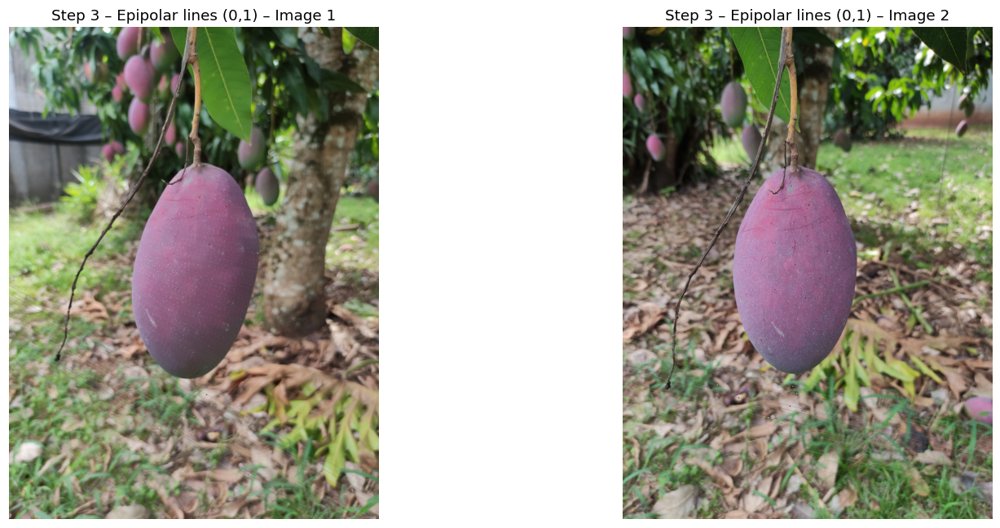

In [26]:
F01, mask01, pts0_in, pts1_in = verified_matches[(0, 1)]
fig = plot_epipolar_lines(images[0], images[1], pts0_in, pts1_in, F01,
                          n_lines=20, title="Step 3 – Epipolar lines (0,1)")
plt.show()

## Step 4 – Camera Intrinsics

The **intrinsic matrix K** maps 3-D camera coordinates to pixel coordinates:

$$K = \begin{bmatrix} f & 0 & c_x \\ 0 & f & c_y \\ 0 & 0 & 1 \end{bmatrix}$$

We estimate $f$ from the assumed horizontal field of view (a reasonable default when no EXIF data is available).

Camera intrinsic matrix K:
[[  3006.84      0.00   1736.00]
 [     0.00   3006.84   2312.00]
 [     0.00      0.00      1.00]]

Focal length  f  = 3006.84 px
Principal point cx, cy = (1736.0, 2312.0) px
Image size           h×w = 4624×3472


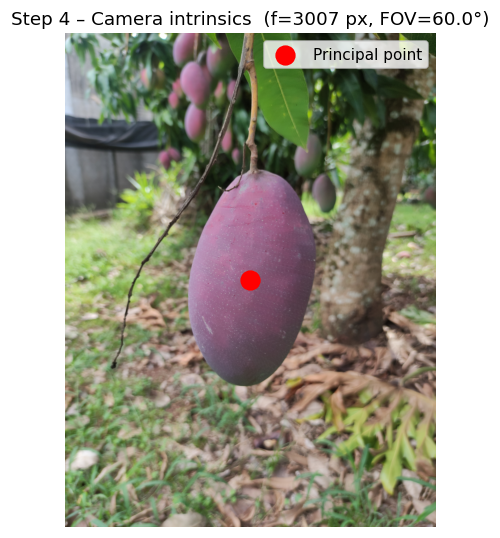

In [27]:
FOV_DEG = 60.0   # assumed horizontal FOV; change if you know the real value

K = estimate_intrinsics(images[0].shape, fov_deg=FOV_DEG)

print("Camera intrinsic matrix K:")
print(np.array2string(K, formatter={"float_kind": lambda x: f"{x:9.2f}"}))
print(f"\nFocal length  f  = {K[0,0]:.2f} px")
print(f"Principal point cx, cy = ({K[0,2]:.1f}, {K[1,2]:.1f}) px")
print(f"Image size           h×w = {images[0].shape[0]}×{images[0].shape[1]}")

# Visualise the principal point on the image
fig, ax = plt.subplots(figsize=(8, 5))
ax.imshow(cv2.cvtColor(images[0], cv2.COLOR_BGR2RGB))
ax.scatter([K[0, 2]], [K[1, 2]], s=150, c="red", zorder=5, label="Principal point")
ax.set_title(f"Step 4 – Camera intrinsics  (f={K[0,0]:.0f} px, FOV={FOV_DEG}°)")
ax.legend()
ax.axis("off")
plt.tight_layout()
plt.show()

## Step 5 – Essential Matrix & Relative Pose

The **Essential matrix** $E = K^T F K$ encodes the same geometry as F but in normalised image coordinates.  
Decomposing $E$ via SVD yields four $(R,t)$ candidates; the correct solution is selected by the **cheirality check** (most triangulated points in front of both cameras).

$$E = K^T\, F\, K, \quad E = [t]_\times R, \quad \text{SVD}(E) \Rightarrow R, t$$

Essential matrix E:
[[   0.04475    0.04719    0.16671]
 [  -0.21503   -0.08530   -0.64433]
 [  -0.28074    0.64844    0.00056]]

Recovered pose (image 0 → image 1):
  Rotation R:
[[ 0.94630  0.13703 -0.29280]
 [-0.16558  0.98335 -0.07492]
 [ 0.27766  0.11938  0.95323]]
  Translation t (unit norm): [-0.9674463  -0.25028447  0.03748778]
  Points in front of both cameras: 96

  Euler angles (roll, pitch, yaw): (7.14°, -16.12°, -9.92°)


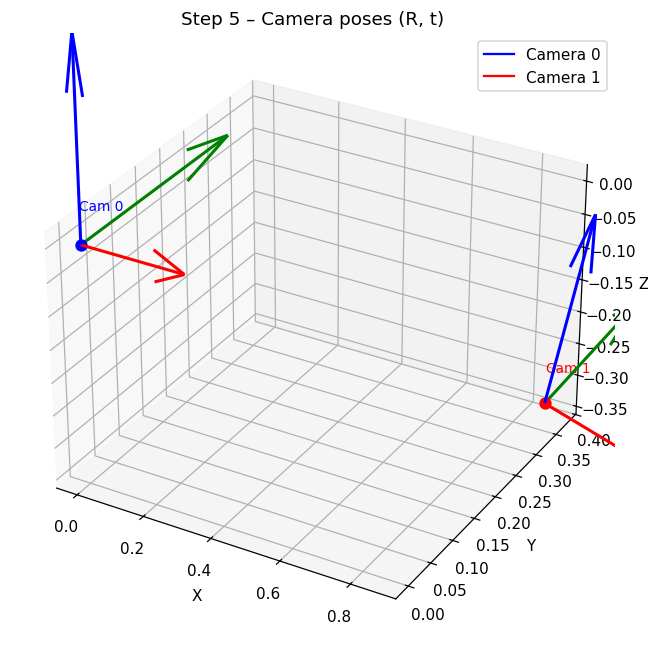

In [28]:
F01, mask01, pts0_in, pts1_in = verified_matches[(0, 1)]

# Compute essential matrix
E, emask = compute_essential(pts0_in, pts1_in, K, reproj_threshold=1.5)
print("Essential matrix E:")
print(np.array2string(E, formatter={"float_kind": lambda x: f"{x:10.5f}"}))

# Recover rotation and translation
R1, t1, n_inliers = recover_pose(E, pts0_in, pts1_in, K, mask=emask)
print(f"\nRecovered pose (image 0 → image 1):")
print(f"  Rotation R:\n{np.array2string(R1, formatter={'float_kind': lambda x: f'{x:8.5f}'})}")
print(f"  Translation t (unit norm): {t1.ravel()}")
print(f"  Points in front of both cameras: {n_inliers}")

# Euler angles for easier reading
def rotation_to_euler(R):
    sy = np.sqrt(R[0,0]**2 + R[1,0]**2)
    singular = sy < 1e-6
    if not singular:
        x = np.arctan2(R[2,1], R[2,2])
        y = np.arctan2(-R[2,0], sy)
        z = np.arctan2(R[1,0], R[0,0])
    else:
        x = np.arctan2(-R[1,2], R[1,1])
        y = np.arctan2(-R[2,0], sy)
        z = 0
    return np.degrees([x, y, z])

rx, ry, rz = rotation_to_euler(R1)
print(f"\n  Euler angles (roll, pitch, yaw): ({rx:.2f}°, {ry:.2f}°, {rz:.2f}°)")

# --- Visualise the camera bases in 3-D ---
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d")

def draw_camera_frustum(ax, R, t, scale=0.3, label="", color="blue"):
    C = (-R.T @ t.reshape(3, 1)).ravel()
    axes_dirs = R.T  # columns = camera X, Y, Z in world
    colors = ["r", "g", "b"]
    labels = ["X", "Y", "Z"]
    for k in range(3):
        d = axes_dirs[:, k] * scale
        ax.quiver(C[0], C[1], C[2], d[0], d[1], d[2],
                  color=colors[k], linewidth=2)
    ax.scatter(*C, s=50, c=color, zorder=5)
    ax.text(C[0], C[1], C[2] + 0.05, label, fontsize=9, color=color)

R0 = np.eye(3); t0 = np.zeros((3, 1))
draw_camera_frustum(ax, R0, t0, label="Cam 0", color="blue")
draw_camera_frustum(ax, R1, t1, label="Cam 1", color="red")

ax.set_xlabel("X"); ax.set_ylabel("Y"); ax.set_zlabel("Z")
ax.set_title("Step 5 – Camera poses (R, t)")
ax.legend(handles=[
    plt.Line2D([0],[0], color='blue', label='Camera 0'),
    plt.Line2D([0],[0], color='red',  label='Camera 1'),
])
plt.tight_layout()
plt.show()

## Step 6 – Triangulation (Initial Pair)

Given projection matrices $P_0 = K[I|0]$ and $P_1 = K[R|t]$, each matched pair of points defines two rays.  
**Linear triangulation (DLT)** finds the 3-D point minimising the algebraic error.

$$\mathbf{X} = \underset{\mathbf{X}}{\arg\min}\; \|x - P\mathbf{X}\|$$

We also filter out points that are behind either camera (*cheirality* constraint).

Triangulated 96 points total.
Points with positive depth in both cameras: 96
X range: [-7.832, 12.533]
Y range: [4.386, 26.901]
Z range: [13.260, 37.337]


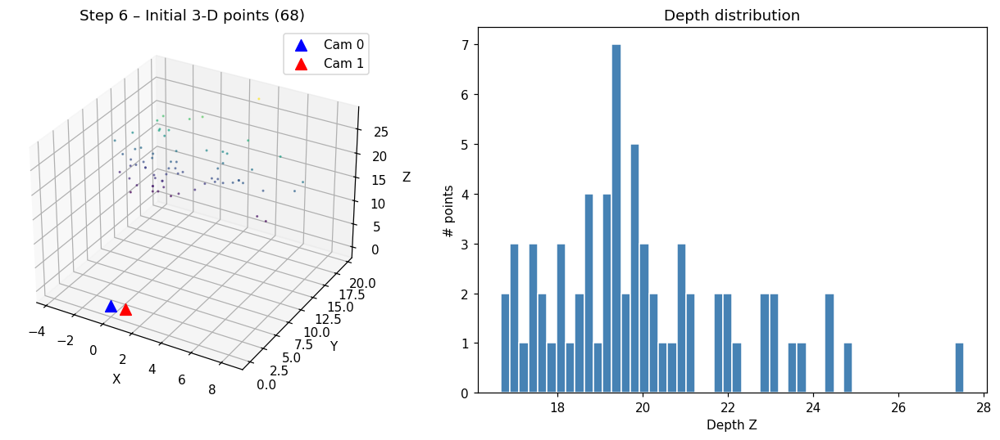

In [29]:
R0 = np.eye(3); t0 = np.zeros((3, 1))
P0 = build_projection_matrix(K, R0, t0)
P1 = build_projection_matrix(K, R1, t1)

# Use only E-verified inliers
pts0_E = pts0_in[emask]
pts1_E = pts1_in[emask]

pts3d_init = triangulate_points(P0, P1, pts0_E, pts1_E)
depth_mask  = filter_triangulated(pts3d_init, P0, P1)
pts3d_valid = pts3d_init[depth_mask]

print(f"Triangulated {len(pts3d_init)} points total.")
print(f"Points with positive depth in both cameras: {depth_mask.sum()}")
print(f"X range: [{pts3d_valid[:,0].min():.3f}, {pts3d_valid[:,0].max():.3f}]")
print(f"Y range: [{pts3d_valid[:,1].min():.3f}, {pts3d_valid[:,1].max():.3f}]")
print(f"Z range: [{pts3d_valid[:,2].min():.3f}, {pts3d_valid[:,2].max():.3f}]")

# --- 3-D scatter ---
from mpl_toolkits.mplot3d import Axes3D
pts_plot = pts3d_valid
# clip outliers
for ax_idx in range(3):
    lo, hi = np.percentile(pts_plot[:, ax_idx], [5, 95])
    pts_plot = pts_plot[(pts_plot[:, ax_idx] >= lo) & (pts_plot[:, ax_idx] <= hi)]

fig = plt.figure(figsize=(12, 5))

ax1 = fig.add_subplot(121, projection="3d")
ax1.scatter(pts_plot[:, 0], pts_plot[:, 1], pts_plot[:, 2],
            s=1, c=pts_plot[:, 2], cmap="viridis", alpha=0.6)
cam_c0 = np.array([0.0, 0.0, 0.0])
cam_c1 = (-R1.T @ t1).ravel()
ax1.scatter(*cam_c0, s=80, c="blue", marker="^", zorder=5, label="Cam 0")
ax1.scatter(*cam_c1, s=80, c="red",  marker="^", zorder=5, label="Cam 1")
ax1.set_xlabel("X"); ax1.set_ylabel("Y"); ax1.set_zlabel("Z")
ax1.set_title(f"Step 6 – Initial 3-D points ({len(pts_plot)})")
ax1.legend()

# --- Depth histogram ---
ax2 = fig.add_subplot(122)
ax2.hist(pts_plot[:, 2], bins=50, color="steelblue", edgecolor="white")
ax2.set_xlabel("Depth Z")
ax2.set_ylabel("# points")
ax2.set_title("Depth distribution")

plt.tight_layout()
plt.show()

## Step 7 – Incremental Reconstruction

We now grow the model by registering the remaining $N-2$ images one at a time:

1. Find 2-D–3-D correspondences between the new image and already-triangulated points.
2. Solve **PnP (Perspective-n-Point)** with RANSAC to get $(R_i, t_i)$.
3. Triangulate new matches to expand the 3-D point cloud.

This incremental approach is the core of systems like COLMAP, VisualSFM, and OpenMVG.

In [30]:
print("Running full incremental SfM pipeline…\n")

recon = run_sfm(
    image_paths=image_paths,
    K=K,
    feature_method=FEATURE,
    match_ratio=RATIO,
    reproj_threshold=4.0,
    verbose=True,
)

n_pts  = len(recon.points3d)
n_cams = len(recon.camera_poses)
print(f"\n=== Reconstruction summary ===")
print(f"  Registered cameras : {n_cams} / {len(images)}")
print(f"  3-D points         : {n_pts}")
print(f"  Mean reprojection error (before BA): {compute_reprojection_error(recon):.2f} px")

Running full incremental SfM pipeline…

  [IMG_20251230_154141.jpg] 4001 keypoints
  [IMG_20251230_154207.jpg] 4000 keypoints
  [IMG_20251230_154210.jpg] 4000 keypoints
  [IMG_20251230_154214.jpg] 4001 keypoints
  [IMG_20251230_154217.jpg] 4000 keypoints
  [IMG_20251230_154220.jpg] 4000 keypoints
  [IMG_20251230_154223.jpg] 4000 keypoints
  [IMG_20251230_154226.jpg] 4000 keypoints
  [IMG_20251230_154229.jpg] 4000 keypoints
  [IMG_20251230_154231.jpg] 4000 keypoints
  [IMG_20251230_154235.jpg] 4000 keypoints
  [IMG_20251230_154238.jpg] 4000 keypoints
  [IMG_20251230_154241.jpg] 4000 keypoints
  [IMG_20251230_154244.jpg] 4000 keypoints
  [IMG_20251230_154247.jpg] 4000 keypoints
  [IMG_20251230_154250.jpg] 4000 keypoints
  [IMG_20251230_154255.jpg] 4001 keypoints
  [IMG_20251230_154301.jpg] 4000 keypoints
  [IMG_20251230_154304.jpg] 4001 keypoints
  [IMG_20251230_154307.jpg] 4000 keypoints
=== Initial pair: images 0 and 1 ===
  Triangulated 56 initial 3-D points.

=== Adding image 2 ===
 

## Step 8 – Bundle Adjustment

After incremental registration, accumulated drift degrades accuracy.  
**Bundle Adjustment (BA)** jointly minimises the sum of squared reprojection errors over all cameras and 3-D points:

$$\min_{\{R_i, t_i\},\, \{\mathbf{X}_j\}} \sum_{(i,j)\in\mathcal{V}} \bigl\|u_{ij} - \pi(K,\,R_i,t_i,\,\mathbf{X}_j)\bigr\|^2$$

We use **scipy's Levenberg-Marquardt** solver.

Reprojection error before BA: 32.844 px
Reprojection error after  BA: 22.351 px
Improvement: 10.493 px  (31.9%)


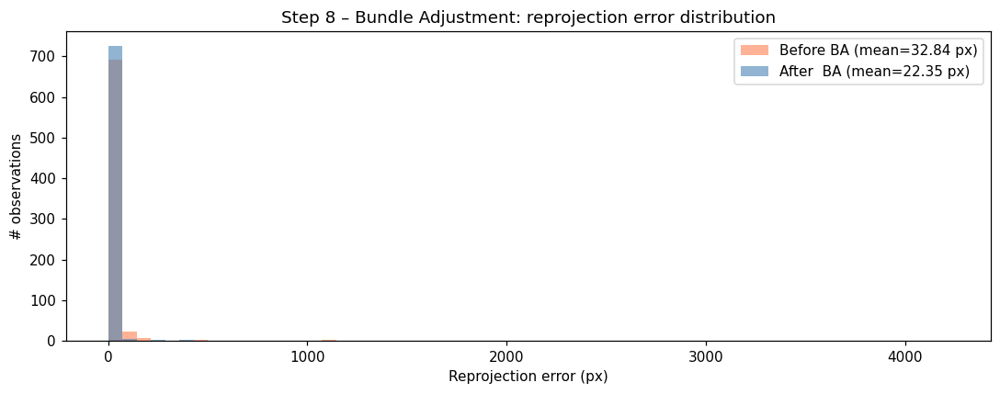

In [31]:
err_before = compute_reprojection_error(recon)
print(f"Reprojection error before BA: {err_before:.3f} px")

recon_ba = bundle_adjustment(recon, max_nfev=300, verbose=False)

err_after = compute_reprojection_error(recon_ba)
print(f"Reprojection error after  BA: {err_after:.3f} px")
print(f"Improvement: {err_before - err_after:.3f} px  ({100*(err_before - err_after)/err_before:.1f}%)")

# --- Compare error histograms (per-observation) ---
def collect_errors(r):
    K_ = r.K
    errs = []
    for tid, obs in r.observations.items():
        if tid not in r.points3d:
            continue
        pt3d = r.points3d[tid].reshape(1, 3).astype(np.float64)
        for cid, uv in obs:
            if cid not in r.camera_poses:
                continue
            R_, t_ = r.camera_poses[cid]
            rv, _ = cv2.Rodrigues(R_)
            proj, _ = cv2.projectPoints(pt3d, rv, t_.astype(np.float64), K_, None)
            errs.append(np.linalg.norm(proj.ravel() - uv))
    return errs

errs_pre  = collect_errors(recon)
errs_post = collect_errors(recon_ba)

fig, ax = plt.subplots(figsize=(10, 4))
bins = np.linspace(0, max(max(errs_pre, default=0), max(errs_post, default=0)) + 1, 60)
ax.hist(errs_pre,  bins=bins, alpha=0.6, label=f"Before BA (mean={err_before:.2f} px)", color="coral")
ax.hist(errs_post, bins=bins, alpha=0.6, label=f"After  BA (mean={err_after:.2f} px)",  color="steelblue")
ax.set_xlabel("Reprojection error (px)")
ax.set_ylabel("# observations")
ax.set_title("Step 8 – Bundle Adjustment: reprojection error distribution")
ax.legend()
plt.tight_layout()
plt.show()

## Step 9 – Visualisation

### 9a – 3-D Point Cloud & Camera Trajectory

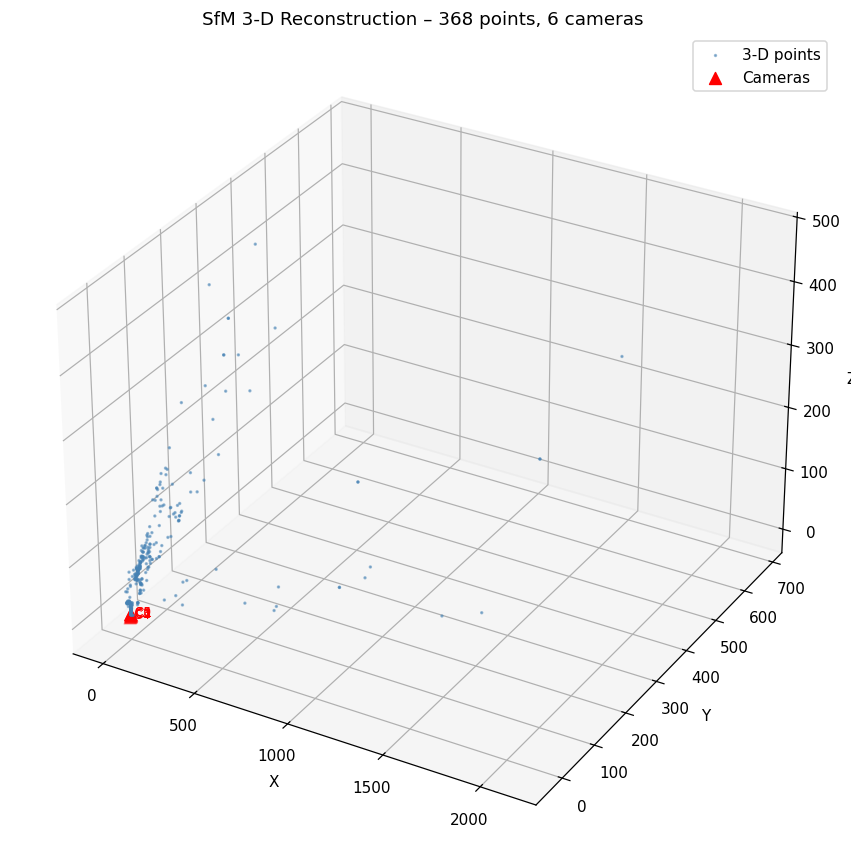

In [32]:
# Use BA-refined result (falls back to raw recon if BA failed)
final_recon = recon_ba if len(recon_ba.points3d) > 0 else recon

fig = plot_3d_reconstruction(final_recon,
    title=f"SfM 3-D Reconstruction – {len(final_recon.points3d)} points, "
          f"{len(final_recon.camera_poses)} cameras",
    point_size=1.5,
    subsample=8000,
)
plt.show()

### 9b – Reprojection Check

We overlay the **observed** 2-D keypoints (green) and the **reprojected** 3-D points (red ×) onto an image.  
Short yellow segments = small reprojection error ✓.

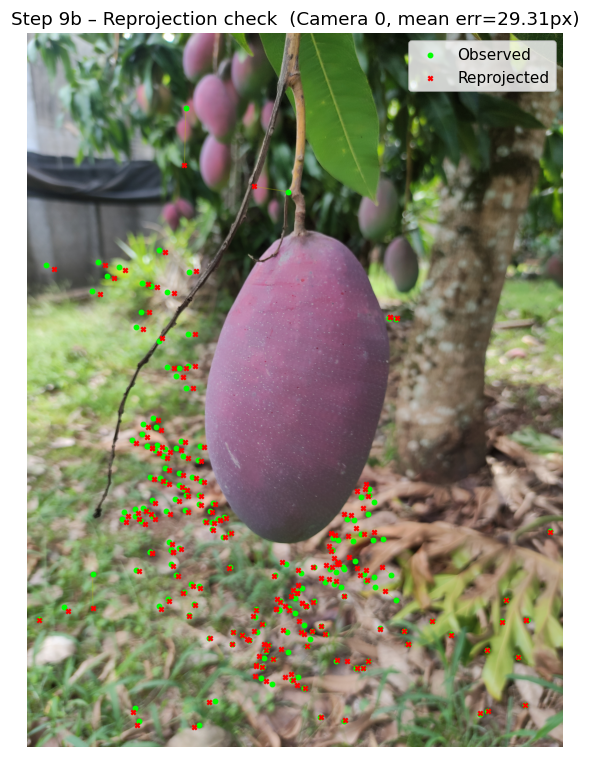

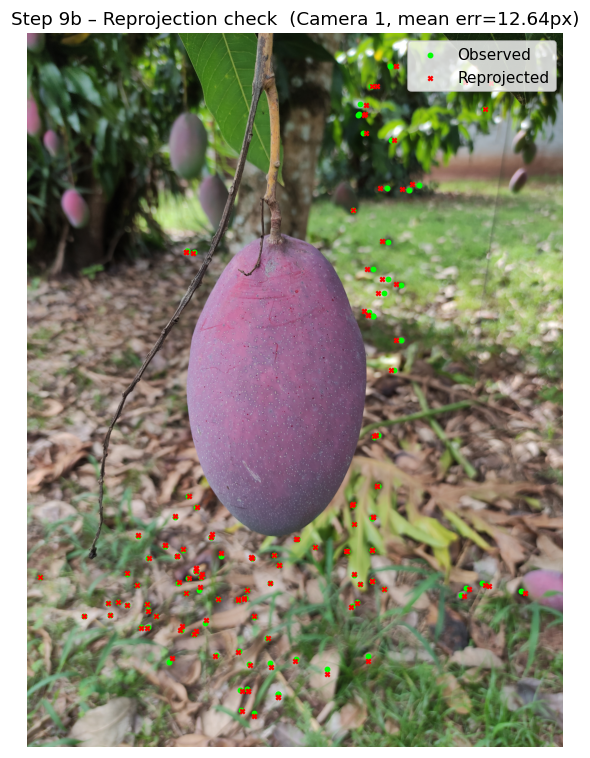

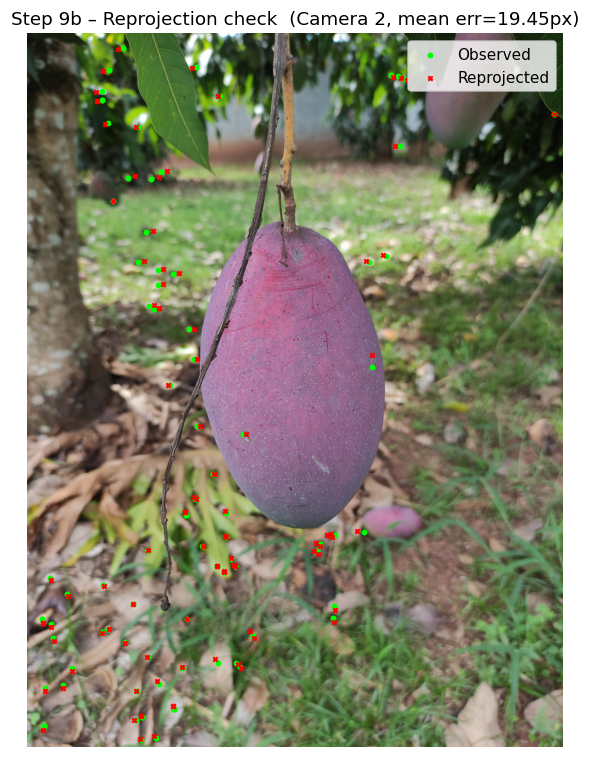

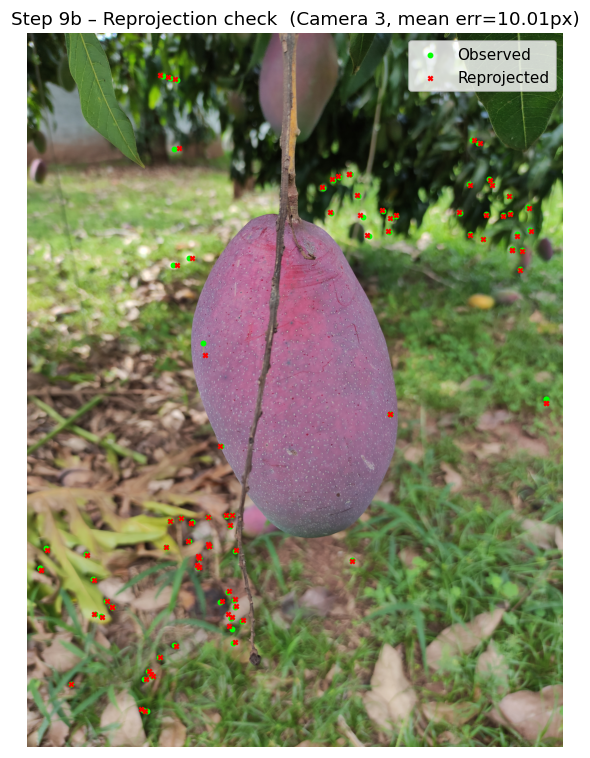

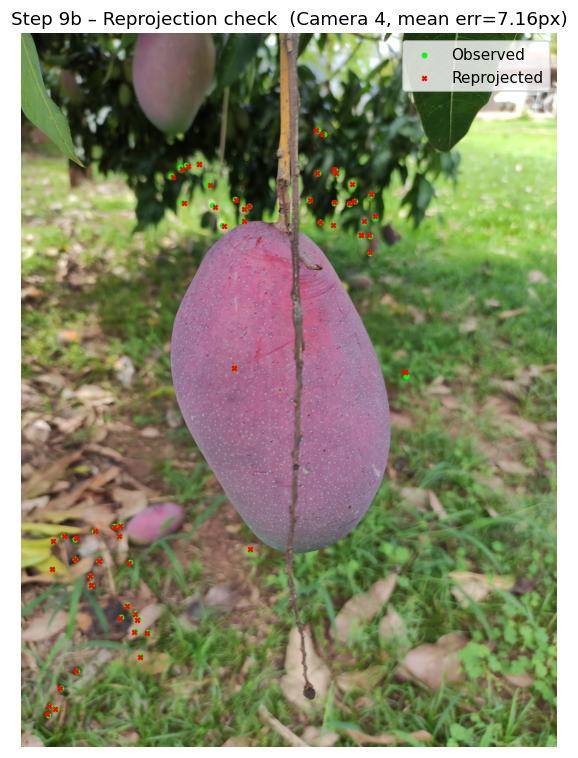

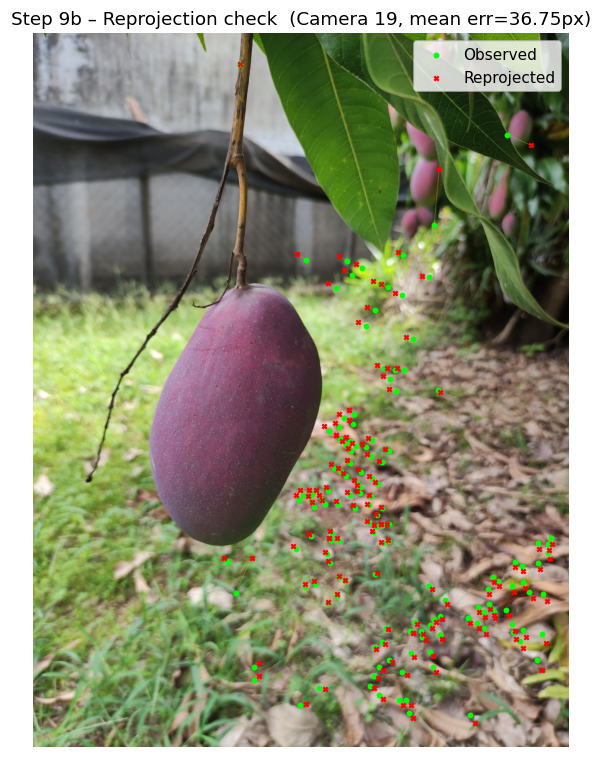

In [33]:
for cam_idx in sorted(final_recon.camera_poses.keys()):
    fig = plot_reprojection(final_recon, images,
                            cam_idx=cam_idx,
                            max_points=300,
                            title="Step 9b – Reprojection check")
    plt.show()

### 9c – Pipeline Summary Statistics

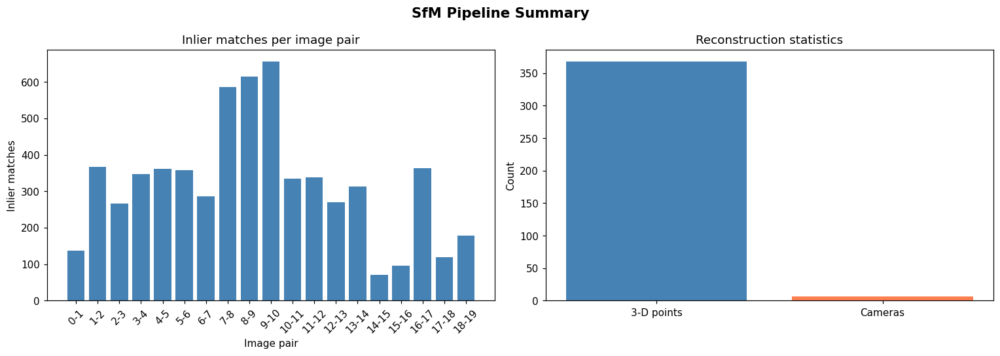


=== Final statistics ===
  Feature detector      : SIFT
  Images used           : 20
  Cameras registered    : 6
  3-D points            : 368
  Total observations    : 736
  Mean reprojection err : 22.351 px


In [34]:
# Inlier counts per pair for the summary plot
inlier_counts_per_pair = {
    k: int(v[1].sum()) for k, v in verified_matches.items()
}

fig = plot_sfm_summary(
    final_recon,
    n_matches_per_pair=inlier_counts_per_pair,
    title="SfM Pipeline Summary",
)
plt.show()

print("\n=== Final statistics ===")
print(f"  Feature detector      : {FEATURE}")
print(f"  Images used           : {len(image_paths)}")
print(f"  Cameras registered    : {len(final_recon.camera_poses)}")
print(f"  3-D points            : {len(final_recon.points3d)}")
print(f"  Total observations    : {sum(len(v) for v in final_recon.observations.values())}")
print(f"  Mean reprojection err : {compute_reprojection_error(final_recon):.3f} px")

### 9d – 3-D Point Cloud coloured by image depth

Colouring each point by its depth value in the first camera gives a pseudo-depth map and highlights the scene structure.

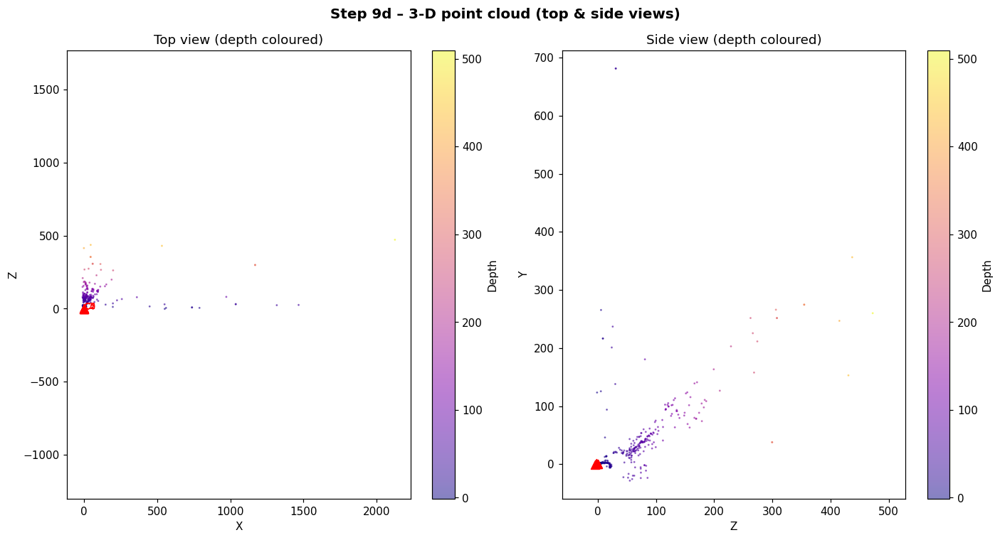

In [35]:
pts_all = final_recon.get_points_array()
cam_centers = final_recon.get_camera_centers()

if len(pts_all) > 0:
    # Remove outliers
    for ax_i in range(3):
        lo, hi = np.percentile(pts_all[:, ax_i], [2, 98])
        pts_all = pts_all[(pts_all[:, ax_i] >= lo) & (pts_all[:, ax_i] <= hi)]

    # Subsample for display
    if len(pts_all) > 10000:
        idx = np.random.choice(len(pts_all), 10000, replace=False)
        pts_all = pts_all[idx]

    # Compute depth from camera 0
    R_c0, t_c0 = final_recon.camera_poses[0]
    cam0_z_axis  = R_c0[2, :]   # world-space direction of camera optical axis
    depths = pts_all @ cam0_z_axis + t_c0.ravel()[2]

    fig = plt.figure(figsize=(13, 7))

    # Top view (X-Z plane)
    ax_top = fig.add_subplot(121)
    sc = ax_top.scatter(pts_all[:, 0], pts_all[:, 2],
                        s=0.8, c=depths, cmap="plasma", alpha=0.5)
    if len(cam_centers) > 0:
        ax_top.scatter(cam_centers[:, 0], cam_centers[:, 2],
                       s=60, c="red", marker="^", zorder=5)
        ax_top.plot(cam_centers[:, 0], cam_centers[:, 2], "r--", alpha=0.7)
        for j, c in enumerate(cam_centers):
            ax_top.annotate(f"C{j}", (c[0], c[2]), fontsize=8, color="red")
    plt.colorbar(sc, ax=ax_top, label="Depth")
    ax_top.set_xlabel("X"); ax_top.set_ylabel("Z")
    ax_top.set_title("Top view (depth coloured)")
    ax_top.set_aspect("equal", adjustable="datalim")

    # Side view (Y-Z plane)
    ax_side = fig.add_subplot(122)
    sc2 = ax_side.scatter(pts_all[:, 2], pts_all[:, 1],
                          s=0.8, c=depths, cmap="plasma", alpha=0.5)
    if len(cam_centers) > 0:
        ax_side.scatter(cam_centers[:, 2], cam_centers[:, 1],
                        s=60, c="red", marker="^", zorder=5)
        ax_side.plot(cam_centers[:, 2], cam_centers[:, 1], "r--", alpha=0.7)
    plt.colorbar(sc2, ax=ax_side, label="Depth")
    ax_side.set_xlabel("Z"); ax_side.set_ylabel("Y")
    ax_side.set_title("Side view (depth coloured)")
    ax_side.set_aspect("equal", adjustable="datalim")

    plt.suptitle("Step 9d – 3-D point cloud (top & side views)", fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.show()
else:
    print("No 3-D points available for visualisation.")

# Dense Multi-View Stereo (MVS)

Having recovered camera poses from SfM, we now compute a **dense** reconstruction by running **Semi-Global Block Matching (SGBM)** stereo on every consecutive camera pair.

### Pipeline
| Sub-step | What happens |
|----------|-------------|
| 10a | For each pair $(i, i+1)$: stereo-rectify using $(R_{rel}, t_{rel})$, run SGBM, reproject to 3-D |
| 10b | Back-project all depth maps to world space using SfM camera poses |
| 10c | Statistical outlier removal (filter noisy depth readings) |
| 10d | Visualise the dense cloud + compare to the sparse SfM result |

Depth bounds per camera are derived automatically from the sparse SfM point cloud so that SGBM focuses on the true scene depth range.


## 10a & 10b – Dense depth maps → world-space point cloud

For each consecutive camera pair $(i, i+1)$ we:
1. Compute the **relative pose** $R_{rel} = R_2 R_1^\top$, $t_{rel} = t_2 - R_{rel} t_1$
2. **Stereo-rectify** both images so epipolar lines are horizontal
3. Run **SGBM** to get a dense disparity map
4. **Reproject** disparity → 3-D → transform to world coordinates using the SfM poses

In [36]:
from utils.mvs import run_mvs

print("Running Multi-View Stereo (SGBM dense stereo on all consecutive pairs)…\n")

pts_dense, colors_dense = run_mvs(
    final_recon,
    images,
    num_disparities=64,   # multiple of 16; increase for more detail (slower)
    block_size=7,          # larger = smoother but less sharp
    depth_scale=3.0,       # depth_max = 98th-pct sparse depth × this factor
    verbose=True,
)

n_sparse = len(final_recon.points3d)
print(f"\nDense cloud  : {len(pts_dense):,} points")
print(f"Sparse SfM   : {n_sparse:,} points")
print(f"Densification: {len(pts_dense) / max(n_sparse, 1):.0f}×")

Running Multi-View Stereo (SGBM dense stereo on all consecutive pairs)…

  Pair (0,1): 3,975,846 dense pts  (baseline=2.7305, depth [1.772, 3854.682])
  Pair (1,2):        0 dense pts  (baseline=1.5674, depth [1.942, 8601.136])
  Pair (2,3): 6,621,043 dense pts  (baseline=1.1395, depth [1.966, 10460.783])
  Pair (3,4):  443,935 dense pts  (baseline=3.1104, depth [1.746, 11329.943])
  Pair (4,19): 1,054,639 dense pts  (baseline=5.4536, depth [2.859, 10118.504])

Total dense points (before filtering): 12,095,463

Dense cloud  : 12,095,463 points
Sparse SfM   : 368 points
Densification: 32868×


## 10c – Statistical outlier removal

Each point is kept only when its mean distance to its 20 nearest neighbours is within  
$\mu + 2\sigma$ of the global distribution — removes floaters and erroneous depth readings.


In [37]:
from utils.mvs import filter_dense_cloud

n_before = len(pts_dense)
pts_dense_clean, colors_dense_clean = filter_dense_cloud(
    pts_dense, colors_dense,
    nb_neighbors=20,
    std_ratio=2.0,
)
n_after = len(pts_dense_clean)
print(f"Before filtering : {n_before:,} pts")
print(f"After  filtering : {n_after:,} pts")
print(f"Removed          : {n_before - n_after:,} pts "
      f"({100*(n_before - n_after)/max(n_before, 1):.1f}%)")

Before filtering : 12,095,463 pts
After  filtering : 11,831,272 pts
Removed          : 264,191 pts (2.2%)


## 10d – Dense reconstruction visualisation

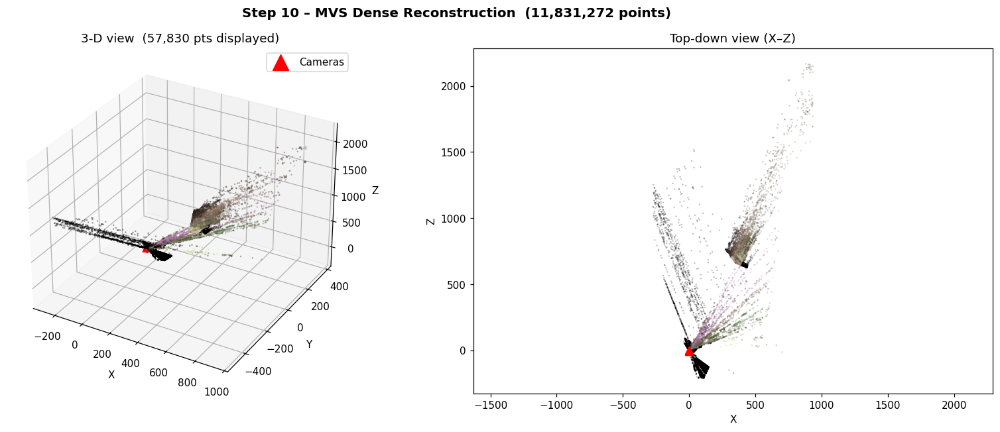

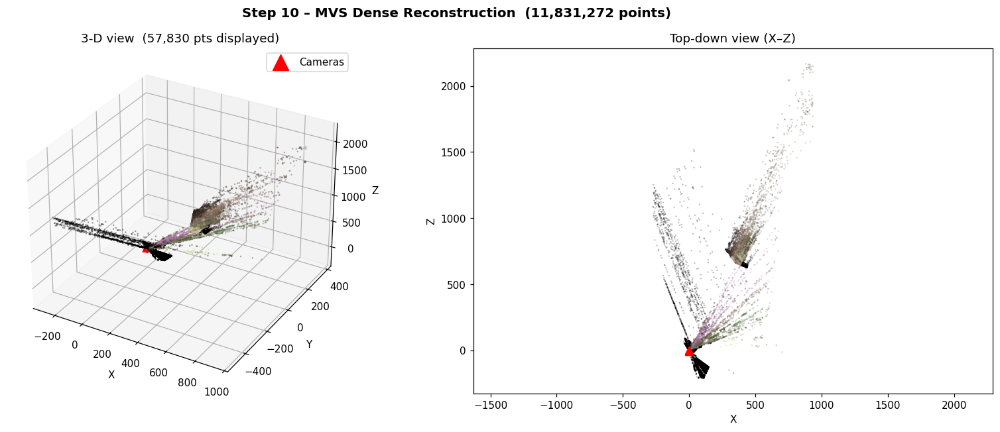

In [38]:
from utils.mvs import plot_dense_reconstruction

plot_dense_reconstruction(
    pts_dense_clean,
    colors_dense_clean,
    recon=final_recon,
    title=f"Step 10 – MVS Dense Reconstruction  ({n_after:,} points)",
    subsample=60000,
)

## 10e – Sparse SfM vs Dense MVS comparison

Side-by-side top-down view showing how MVS fills in the gaps left by the sparse SfM cloud.


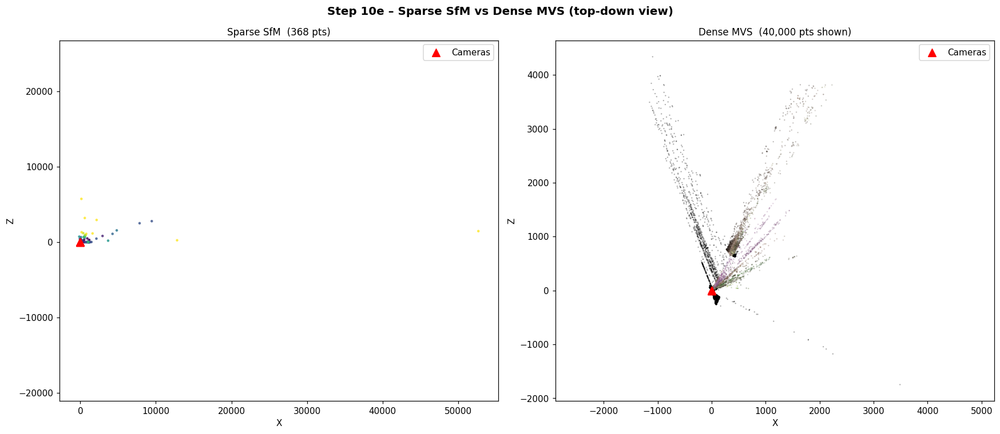


Final dense cloud : 11,831,272 pts  |  Densification : 32150× vs sparse SfM


In [39]:
sparse_pts_plot  = final_recon.get_points_array()
cam_centers_plot = final_recon.get_camera_centers()

# Clip dense cloud to the same XZ extent as the sparse cloud (+ 30 % margin)
if len(sparse_pts_plot) > 0 and len(pts_dense_clean) > 0:
    x_lo, x_hi = np.percentile(sparse_pts_plot[:, 0], [1, 99])
    z_lo, z_hi = np.percentile(sparse_pts_plot[:, 2], [1, 99])
    margin = max(x_hi - x_lo, z_hi - z_lo) * 0.3
    x_lo -= margin; x_hi += margin
    z_lo -= margin; z_hi += margin
    mask_d = (
        (pts_dense_clean[:, 0] >= x_lo) & (pts_dense_clean[:, 0] <= x_hi) &
        (pts_dense_clean[:, 2] >= z_lo) & (pts_dense_clean[:, 2] <= z_hi)
    )
    pts_d  = pts_dense_clean[mask_d]
    cols_d = colors_dense_clean[mask_d] if colors_dense_clean is not None else None
else:
    pts_d, cols_d = pts_dense_clean, colors_dense_clean

# Subsample for display
MAX_DISP = 40_000
if len(pts_d) > MAX_DISP:
    idx = np.random.choice(len(pts_d), MAX_DISP, replace=False)
    pts_d  = pts_d[idx]
    cols_d = cols_d[idx] if cols_d is not None else None

fig, axes = plt.subplots(1, 2, figsize=(16, 7))

# --- Sparse SfM ---
ax = axes[0]
if len(sparse_pts_plot) > 0:
    lo2, hi2 = np.percentile(sparse_pts_plot[:, 1], [2, 98])
    depths_s = np.clip(sparse_pts_plot[:, 1], lo2, hi2)
    ax.scatter(sparse_pts_plot[:, 0], sparse_pts_plot[:, 2],
               s=4, c=depths_s, cmap="viridis", alpha=0.7)
if len(cam_centers_plot) > 0:
    ax.scatter(cam_centers_plot[:, 0], cam_centers_plot[:, 2],
               s=80, c="red", marker="^", zorder=5, label="Cameras")
    ax.plot(cam_centers_plot[:, 0], cam_centers_plot[:, 2], "r--", alpha=0.6)
ax.set_title(f"Sparse SfM  ({len(sparse_pts_plot):,} pts)", fontsize=11)
ax.set_xlabel("X"); ax.set_ylabel("Z")
ax.set_aspect("equal", adjustable="datalim")
ax.legend()

# --- Dense MVS ---
ax = axes[1]
if len(pts_d) > 0:
    c_mvs = (cols_d / 255.0) if cols_d is not None else pts_d[:, 1]
    ax.scatter(pts_d[:, 0], pts_d[:, 2], s=0.3, c=c_mvs, alpha=0.3)
if len(cam_centers_plot) > 0:
    ax.scatter(cam_centers_plot[:, 0], cam_centers_plot[:, 2],
               s=80, c="red", marker="^", zorder=5, label="Cameras")
    ax.plot(cam_centers_plot[:, 0], cam_centers_plot[:, 2], "r--", alpha=0.6)
ax.set_title(f"Dense MVS  ({len(pts_d):,} pts shown)", fontsize=11)
ax.set_xlabel("X"); ax.set_ylabel("Z")
ax.set_aspect("equal", adjustable="datalim")
ax.legend()

plt.suptitle("Step 10e – Sparse SfM vs Dense MVS (top-down view)",
             fontsize=13, fontweight="bold")
plt.tight_layout()
plt.show()

print(f"\nFinal dense cloud : {n_after:,} pts  |  "
      f"Densification : {n_after / max(len(final_recon.points3d), 1):.0f}× vs sparse SfM")